In [2]:
# Импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cbook import boxplot_stats
import seaborn as sns
import sklearn
from pandas.plotting import scatter_matrix
import ydata_profiling #ex pandas_profiling
from ydata_profiling import ProfileReport
import tensorflow as tf
from tensorflow import keras
from sklearn import preprocessing
import plotly.express as px
from sklearn import linear_model
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer, LabelEncoder, MinMaxScaler, StandardScaler

import pickle

%matplotlib inline

In [18]:
# Импорт файлов датасета
table_1 = pd.read_excel('/Users/ekaterinakorotkova/Development/Tanya_DS/VKR/Dataset/X_bp.xlsx')
table_2 = pd.read_excel('/Users/ekaterinakorotkova/Development/Tanya_DS/VKR/Dataset/X_nup.xlsx')
print(table_1.shape)
print(table_2.shape)

(1023, 11)
(1040, 4)


#Вывести данные таблиц

In [11]:
table_1.head(3)
#print(table_1.columns)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,"1,857142857",2030,"738,7368421",30,"22,26785714",100,210,70,3000,220
1,1,"1,857142857",2030,"738,7368421",50,"23,75","284,6153846",210,70,3000,220
2,2,"1,857142857",2030,"738,7368421","49,9",33,"284,6153846",210,70,3000,220


In [12]:
table_2.head(3)

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4,57
1,1,0,4,60
2,2,0,4,70


In [13]:
table_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   Unnamed: 0                            1023 non-null   int64 
 1   Соотношение матрица-наполнитель       1023 non-null   object
 2   Плотность, кг/м3                      1023 non-null   object
 3   модуль упругости, ГПа                 1023 non-null   object
 4   Количество отвердителя, м.%           1023 non-null   object
 5   Содержание эпоксидных групп,%_2       1023 non-null   object
 6   Температура вспышки, С_2              1023 non-null   object
 7   Поверхностная плотность, г/м2         1023 non-null   object
 8   Модуль упругости при растяжении, ГПа  1023 non-null   object
 9   Прочность при растяжении, МПа         1023 non-null   object
 10  Потребление смолы, г/м2               1023 non-null   object
dtypes: int64(1), object(10)
memory

In [14]:
table_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1040 entries, 0 to 1039
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Unnamed: 0          1040 non-null   int64 
 1   Угол нашивки, град  1040 non-null   int64 
 2   Шаг нашивки         1040 non-null   object
 3   Плотность нашивки   1040 non-null   object
dtypes: int64(2), object(2)
memory usage: 32.6+ KB


In [15]:
# Объединить таблицу по индексу
df = pd.merge(table_1, table_2, on='Unnamed: 0', how='inner')

print(df.shape)
print(table_1.shape)
print(table_2.shape)
df.head(3)

(1023, 14)
(1023, 11)
(1040, 4)


,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,"1,857142857",2030,"738,7368421",30,"22,26785714",100,210,70,3000,220,0,4,57
1,1,"1,857142857",2030,"738,7368421",50,"23,75","284,6153846",210,70,3000,220,0,4,60
2,2,"1,857142857",2030,"738,7368421","49,9",33,"284,6153846",210,70,3000,220,0,4,70


In [16]:
# Удалить столбец, для лучшей читаемости данных
df.drop(df.filter(regex="Unnamed"), axis=1, inplace=True)
df.head(3)
print(df.isna().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
"Угол нашивки, град",1023.0,44.252199,45.015793,0.0,0.0,0.0,90.0,90.0


In [117]:
# первичный анализ данных при помощи ydata-profiling (ex. pandas-profiling)
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

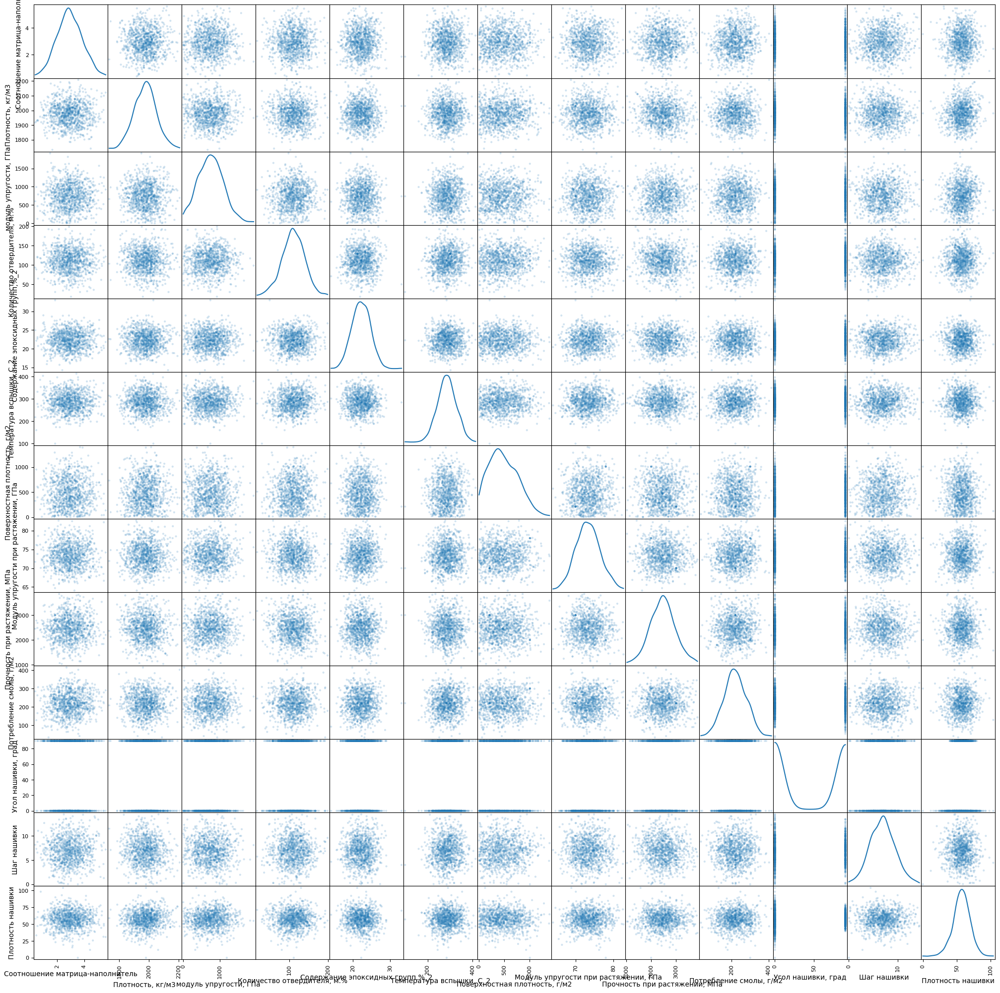

In [118]:
# матрица рассеяния 
scatter_matrix(df, alpha=0.2, figsize=(25, 25), diagonal='kde');

<AxesSubplot: >

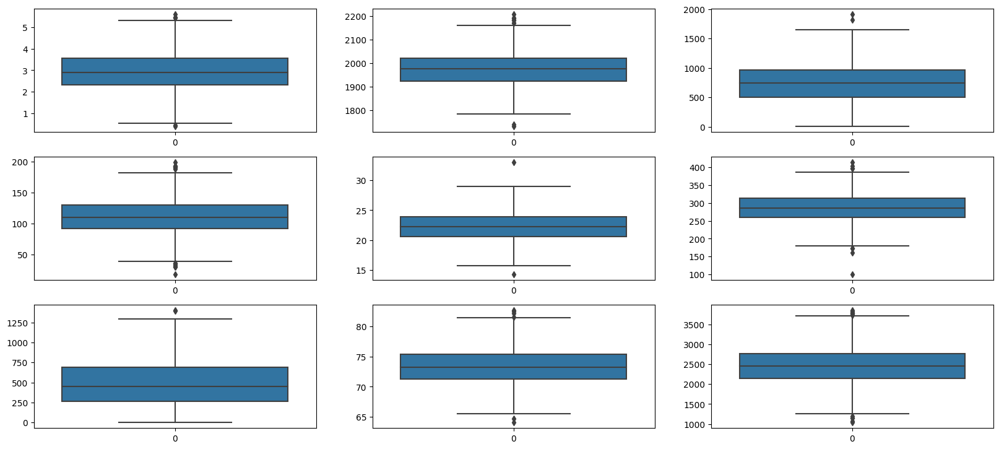

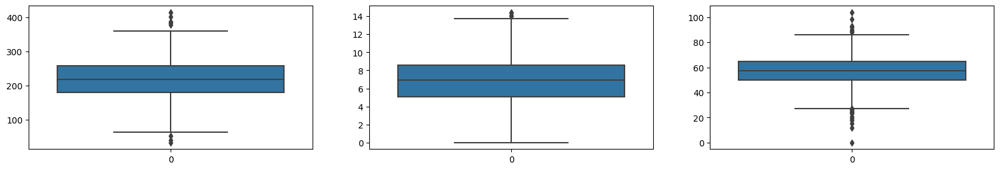

In [142]:
# сформируем графики данных по столбцам
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(531)
sns.boxplot(df['Соотношение матрица-наполнитель'])
ax = fig.add_subplot(532)
sns.boxplot(df['Плотность, кг/м3'])
ax = fig.add_subplot(533)
sns.boxplot(df['модуль упругости, ГПа'])
ax = fig.add_subplot(534)
sns.boxplot(df['Количество отвердителя, м.%'])
ax = fig.add_subplot(535)
sns.boxplot(df['Содержание эпоксидных групп,%_2'])
ax = fig.add_subplot(536)
sns.boxplot(df['Температура вспышки, С_2'])
ax = fig.add_subplot(537)
sns.boxplot(df['Поверхностная плотность, г/м2'])
ax = fig.add_subplot(538)
sns.boxplot(df['Модуль упругости при растяжении, ГПа'])
ax = fig.add_subplot(539)
sns.boxplot(df['Прочность при растяжении, МПа'])
fig2 = plt.figure(figsize=(20, 3))
ax = fig2.add_subplot(131)
sns.boxplot(df['Потребление смолы, г/м2'])
ax = fig2.add_subplot(132)
sns.boxplot(df['Шаг нашивки'])
ax = fig2.add_subplot(133)
sns.boxplot(df['Плотность нашивки'])

<AxesSubplot: >

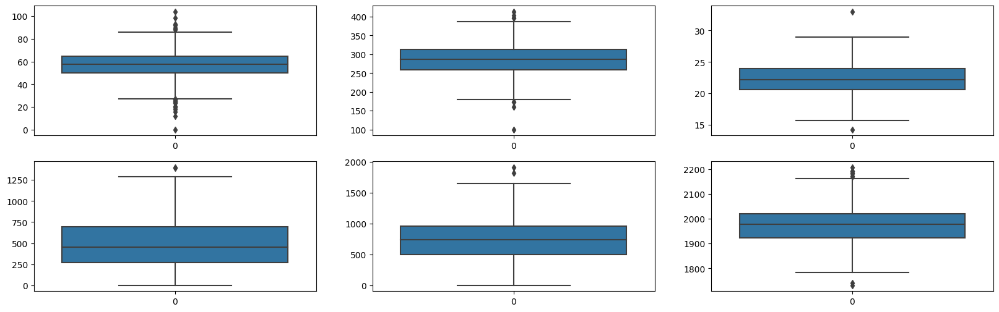

In [143]:
fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(231)
sns.boxplot(df['Плотность нашивки'])
ax = fig.add_subplot(232)
sns.boxplot(df['Температура вспышки, С_2'])
ax = fig.add_subplot(233)
sns.boxplot(df['Содержание эпоксидных групп,%_2'])
ax = fig.add_subplot(234)
sns.boxplot(df['Поверхностная плотность, г/м2'])
ax = fig.add_subplot(235)
sns.boxplot(df['модуль упругости, ГПа'])
ax = fig.add_subplot(236)
sns.boxplot(df['Плотность, кг/м3'])

In [137]:
# Обработка выбросов и шумов
# Столбец: Плотность нашивки
for x in ['Плотность нашивки']:
    df.loc[df[x] > 95,x] = np.nan
    df.loc[df[x] < 9,x] = np.nan

# Столбец: Температура вспышки, С_2
for x in ['Температура вспышки, С_2']:
    df.loc[df[x] > 400,x] = np.nan
    df.loc[df[x] < 150,x] = np.nan

# Столбец: Содержание эпоксидных групп,%_2
for x in ['Содержание эпоксидных групп,%_2']:
    df.loc[df[x] > 30,x] = np.nan
    df.loc[df[x] < 15,x] = np.nan

# Столбец: Поверхностная плотность, г/м2
for x in ['Поверхностная плотность, г/м2']:
    df.loc[df[x] > 1330,x] = np.nan
    df.loc[df[x] < 2,x] = np.nan

# Столбец: модуль упругости, ГПа
for x in ['модуль упругости, ГПа']:
    df.loc[df[x] > 1700,x] = np.nan
    df.loc[df[x] < 2,x] = np.nan

# Столбец: Плотность, кг/м3
for x in ['Плотность, кг/м3']:
    df.loc[df[x] > 2195,x] = np.nan
    df.loc[df[x] < 1760,x] = np.nan
    
df = df.dropna()

AttributeError: 'NoneType' object has no attribute 'loc'

(1005, 13)

KeyError: 0

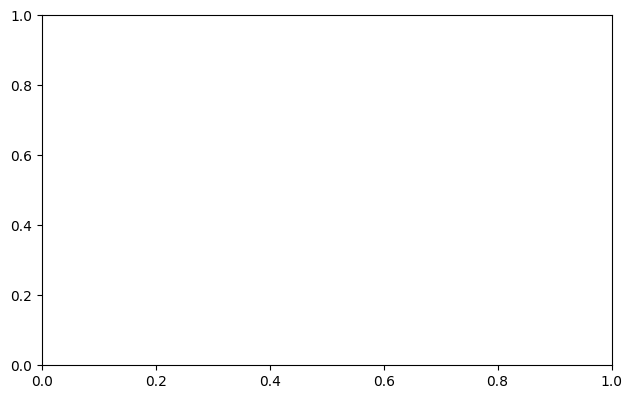

In [126]:
# После обработки выбросов и шумов
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(231)
sns.boxplot(df['Плотность нашивки'])
ax = fig.add_subplot(232)
sns.boxplot(df['Температура вспышки, С_2'])
ax = fig.add_subplot(233)
sns.boxplot(df['Содержание эпоксидных групп,%_2'])
ax = fig.add_subplot(234)
sns.boxplot(df['Поверхностная плотность, г/м2'])
ax = fig.add_subplot(235)
sns.boxplot(df['модуль упругости, ГПа'])
ax = fig.add_subplot(236)
sns.boxplot(df['Плотность, кг/м3'])

In [123]:
print(sum(df.isnull().sum()))
df.head(3)

0


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [ ]:
#сравним наши модели по метрике МАЕ
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'DecisionTree', 'SGD', 'MLP', 'Lasso'], 'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr, mae_dtr, mae_sdg, mae_mlp, mae_clf]} 

mae_df = pd.DataFrame(mae_df)

In [ ]:
#подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr_grid = RandomForestRegressor(n_estimators = 200, criterion = 'mse', max_depth = 15, max_features = 'auto')
#Обучаем модель
rfr_grid.fit(x_train_1, y_train_1)

predictions_rfr_grid = rfr_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_rfr_grid = mean_absolute_error(predictions_rfr_grid, y_test_1)
mae_rfr_grid

In [ ]:
new_row_in_mae_df = {'Регрессор': 'RandomForest_GridSearchCV', 'MAE': mae_rfr_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

In [ ]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn_grid.fit(x_train_1, y_train_1)

predictions_knn_grid = knn_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_knn_grid = mean_absolute_error(predictions_knn_grid, y_test_1)
mae_knn_grid

In [ ]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors_GridSearchCV', 'MAE': mae_knn_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df